In [1]:
import os,sys
import pandas as pd
import numpy as np
import scanpy as sc
import glob
import scanpy as sc
import scanpy.external as sce
import datetime
import re
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import tangram as tg
import matplotlib as mpl
import skimage
from anndata import AnnData
import pathlib
import tangram as tg
import math

/opt/anaconda3/envs/tangram-env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
vsm_dir = "/Users/jamrute/Desktop/human_CAD/data/Visium_*"
vsm_file = "filtered_feature_bc_matrix.h5"
rpt_file = "metrics_summary.csv"

samples = glob.glob(vsm_dir)
reports = glob.glob(vsm_dir + "/" + rpt_file)
samples.sort()
reports.sort()

outdir = "/Users/jamrute/Desktop/human_CAD/tangram/output"

In [3]:
key = "Visium_"
adata_set = []
qc1_set = []
qc2_set = []
sample_set = []
for i in range(len(samples)):
    adata=sc.read_visium(samples[i], count_file=vsm_file)
    adata.var_names_make_unique()
    sid = [key+samples[i].split(key)[1].split("/")[0]]*adata.shape[0]
    adata.obs["sample_id"] = [key+samples[i].split(key)[1].split("/")[0]]*adata.shape[0]
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
    adata_set.append(adata)
    qc_report = pd.read_csv(reports[i], sep=",")
    qc1_set.append( qc_report[["Number of Spots Under Tissue", "Valid UMIs", "Genes Detected" ]].values.tolist()[0] )
    qc2_set.append( adata.obs[["sample_id", "pct_counts_mt", "total_counts", "n_genes_by_counts", "log1p_total_counts","log1p_n_genes_by_counts"]].values.tolist())
    sample_set.append(sid[0])

qc1_pd = pd.DataFrame(qc1_set, index=sample_set, columns = ["Number of Spots Under Tissue", "Valid UMIs", "Genes Detected" ])
qc2_pd = pd.DataFrame( [ sub2 for sub1 in qc2_set for sub2 in sub1 ], columns = ["sample", "pct_counts_mt", "total_counts", "n_genes_by_counts", "log1p_total_counts","log1p_n_genes_by_counts"])
qc1_pd["index"] = qc1_pd.index.tolist()
qc2_pd["index"] = qc2_pd.index.tolist()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [6]:
col1 = ["Number of Spots Under Tissue", "Valid UMIs", "Genes Detected"]
fig, axs = plt.subplots(1, 3, figsize=(20, 4))
for n in range(len(col1)) :
    ax1=sns.barplot(data=qc1_pd, x='index', y=col1[n], dodge=True, ax=axs[n]);
    ax1.set_xticklabels(ax1.get_xticklabels(),rotation = 90)
    #plt.savefig(os.path.join(outdir, "QC1.bar.across.samples.pdf"), bbox_inches='tight')

plt.close()

In [7]:
col2 = ["log1p_total_counts","log1p_n_genes_by_counts"]
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
for n in range(len(col2)) :
    ax1 =sns.boxplot(x="sample", y=col2[n], data=qc2_pd, saturation=0.5, ax=axs[n])
    locs, labels = plt.xticks()
    ax1.set_xticklabels(ax1.get_xticklabels(),rotation = 90)
    #plt.savefig(os.path.join(outdir, "QC2.box.log10.across.samples.pdf"), bbox_inches='tight')

plt.close()

In [8]:
col3 = ["total_counts", "n_genes_by_counts", "pct_counts_mt"]
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
for n in range(len(col3)) :
    ax1= sns.boxplot(x="sample", y=col3[n], data=qc2_pd, saturation=0.5, ax=axs[n])
    ax1.set_xticklabels(ax1.get_xticklabels(),rotation = 90)
    #plt.savefig(os.path.join(outdir, "QC2.box.across.samples.pdf"), bbox_inches='tight')

plt.close()

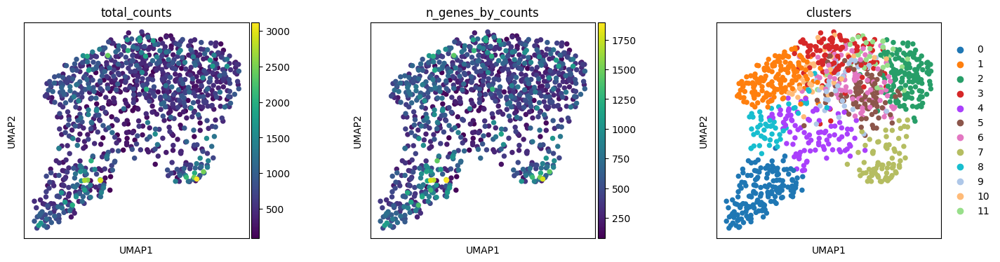

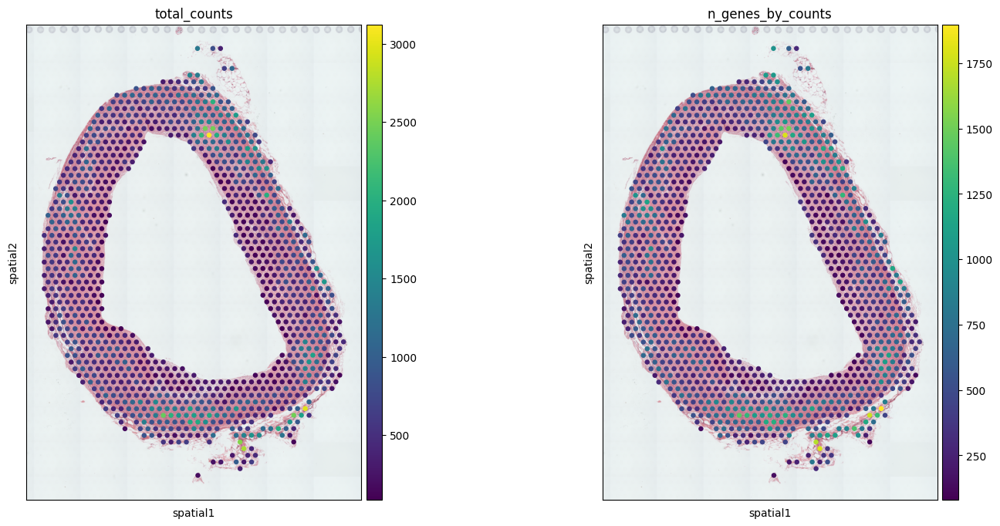

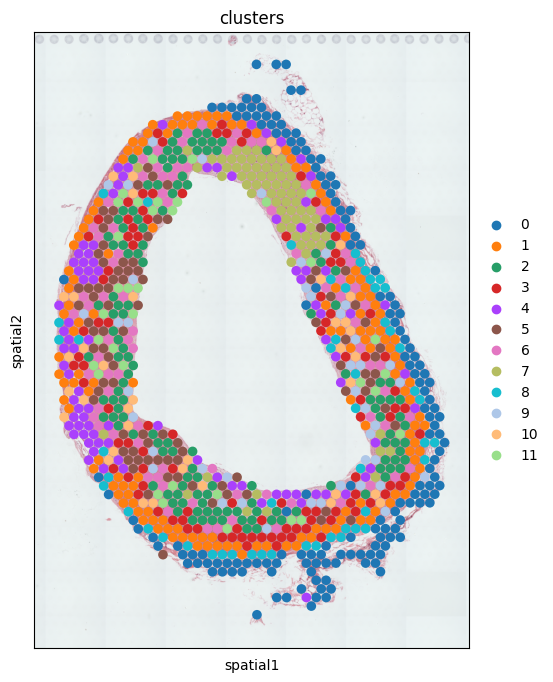

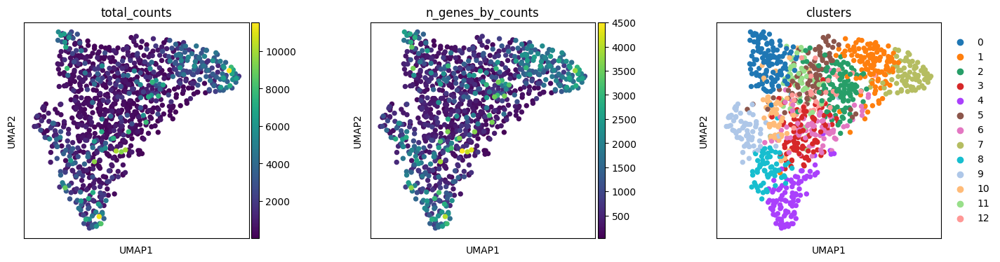

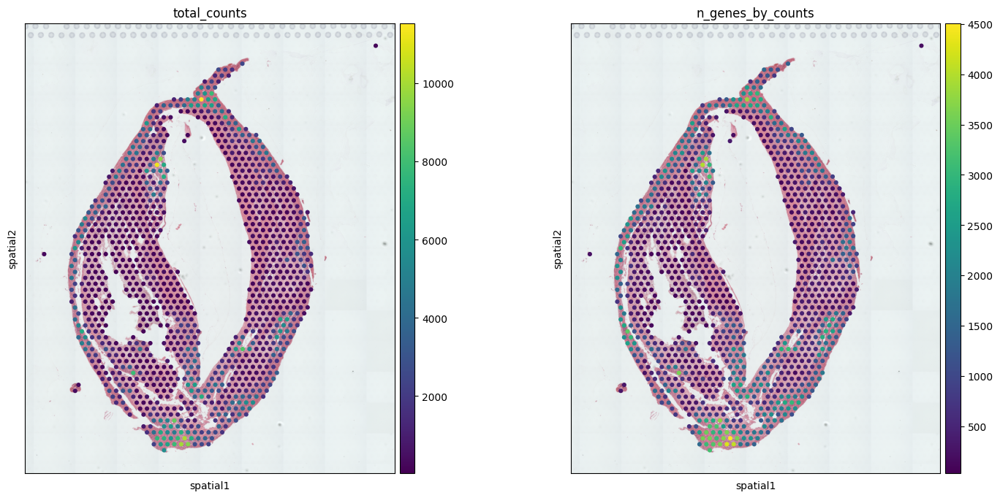

...

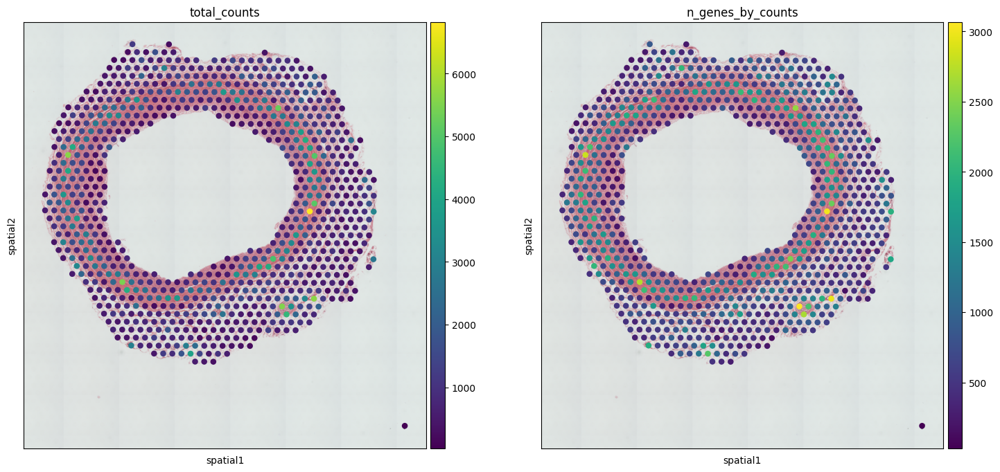

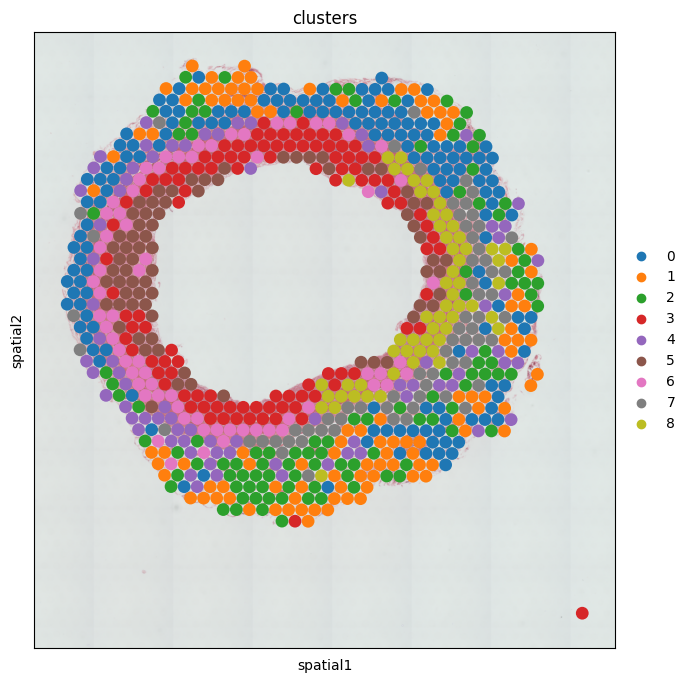

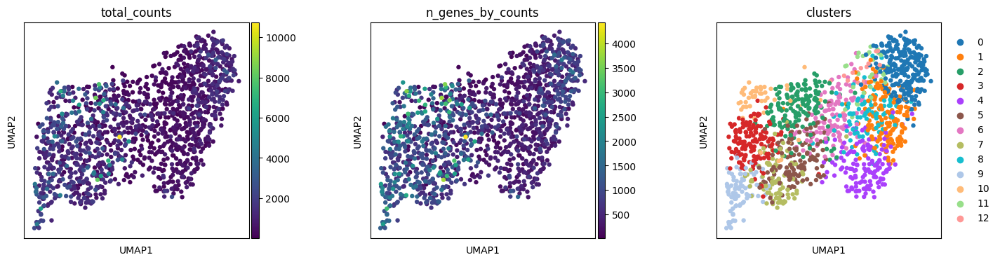

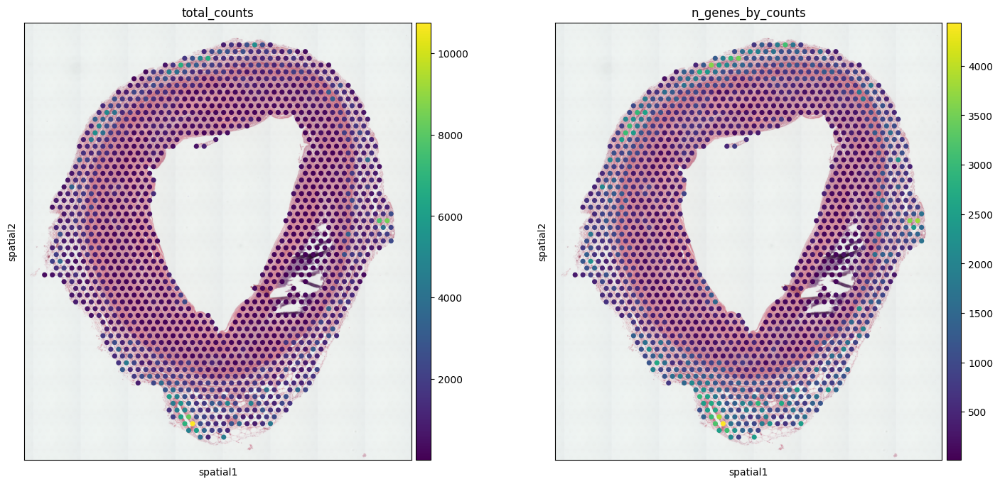

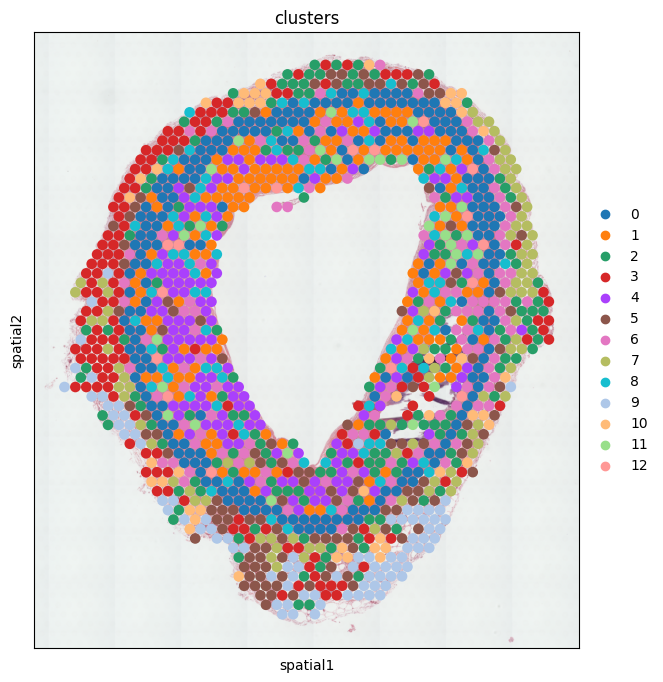

In [9]:
## preprocess
## ------------------------- ##
for n in range(len(sample_set)):
    # Normalize, get HVG
    sc.pp.normalize_total(adata_set[n], inplace=True)
    sc.pp.log1p(adata_set[n])
    sc.pp.highly_variable_genes(adata_set[n], flavor="seurat", n_top_genes=3000)
    ## PCA, UMAP 
    sc.pp.pca(adata_set[n])
    sc.pp.neighbors(adata_set[n])
    sc.tl.umap(adata_set[n])
    sc.tl.leiden(adata_set[n], resolution=1.5, key_added="clusters")
    ## Visualize
    plt.rcParams["figure.figsize"] = (4, 4)
    sc.pl.umap(adata_set[n], color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)
    #plt.savefig(os.path.join(outdir, sample_set[n]+"_qc_after_filterout.pdf"))
    plt.close()
    ## Visualization in spatial coordinates
    plt.rcParams["figure.figsize"] = (8, 8)
    sc.pl.spatial(adata_set[n], img_key="hires", color=["total_counts", "n_genes_by_counts"])
    #plt.savefig(os.path.join(outdir, sample_set[n]+".sp.pdf"))
    plt.close()
    sc.pl.spatial(adata_set[n], img_key="hires", color="clusters", size=1.5)
    #plt.savefig(os.path.join(outdir, sample_set[n]+".sp.umap.pdf"))
    plt.close()

## Load CITE-seq reference

In [10]:
new_f = "annotated_raw.h5ad"
ad_sc = sc.read(new_f)
celltype_column_name = 'cell.type'

In [11]:
meta_data = pd.read_csv('./meta_raw.csv', index_col=0)

In [12]:
ad_sc.obs = meta_data

In [13]:
sc.pp.normalize_total(ad_sc, inplace=True)
sc.pp.log1p(ad_sc)
sc.pp.highly_variable_genes(ad_sc, flavor="seurat", n_top_genes=3000)
ad_sc.raw = ad_sc
ad_sc = ad_sc[:, ad_sc.var.highly_variable]

In [14]:
sc.tl.rank_genes_groups(ad_sc, groupby=celltype_column_name, use_raw=False)

## use the intersection of the highly variable genes.
markers_df = pd.DataFrame(ad_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
genes_sc = np.unique(markers_df.melt().value.values)

#ad_sc.write_h5ad(filename="reference_scanpy.h5ad")

In [15]:
## Tangram
## Deconvolution and mapping
for i in range(len(samples)):
    ## ------------------------- ##
    ## tangram set up 
    ## ------------------------- ##
    ad_sp = adata_set[i]
    ad_sp.obs['sample'] = list(ad_sp.uns['spatial'].keys())[0]
    ##
    ## find mitochondria-encoded (MT) genes
    ## ------------------------- ##
    ad_sp.var['MT_gene'] = [gene.startswith('MT-') for gene in ad_sp.var.index]
    ##
    ## remove MT genes for spatial mapping (keeping their counts in the object)
    ## ------------------------- ##
    ad_sp.obsm['MT'] = ad_sp[:, ad_sp.var['MT_gene'].values].X.toarray()
    ad_sp = ad_sp[:, ~ad_sp.var['MT_gene'].values]
    ## ------------------------- ##
    ## run Tangram
    ## |_ 1.  to run Tangram at cell level
    ## |_ 2.  to run Tangram at cluster level
    ##
    ## 1. run Tangram at cell level
    ## ------------------------- ##
    ## pp_adatas finds the common genes between adata_sc, adata_sp, 
    ## and saves them in two adatas.uns for mapping and analysis later.
    ## ------------------------- ##
    ## If genes=None, Tangram maps using all genes shared by the two datasets
    ## ------------------------- ##
    genes_st = ad_sp.var_names.values
    genes = list(set(genes_sc).intersection(set(genes_st)))
    tg.pp_adatas(ad_sc, ad_sp, genes=None)
    ## ------------------------- ##
    ## ad_map, is a cell-by-voxel structure 
    ## where ad_map.X[i, j] gives the probability for cell i to be in voxel j
    ## ------------------------- ##
    ## plot_cell_annotation_sc parameter (1), (2), (3)
    ## (1) Spot Size & (2) Scale Factor : shoule be None when ad_sp.uns['spatial'] exist
    ## (3) ax : A matplotlib axes object. Only works if plotting a single component. 
    ## ------------------------- ##
    ## def plot_cell_annotation_sc(
    ##    adata_sp, 
    ##    annotation_list, 
    ##    x="x", 
    ##    y="y", 
    ##    spot_size=None, 
    ##    scale_factor=None, 
    ##    perc=0,
    ##    ax=None
    ##):
    ## ------------------------- ##
    ## output saved in 
    ## df = ad_sp.obsm["tangram_ct_pred"][annotation_list]
    ## ------------------------- ##
    ad_map = tg.map_cells_to_space(ad_sc, ad_sp, num_epochs=500)
    ## ------------------------- ##
    tg.project_cell_annotations(ad_map, ad_sp, annotation=celltype_column_name)
    annotation_list = list(pd.unique(ad_sc.obs[celltype_column_name]))
    tg.plot_cell_annotation_sc(ad_sp, annotation_list,x='x', y='y',spot_size= None, perc=0.1)
    plt.savefig(os.path.join(outdir, ad_sp.obs['sample'][0]+".tangram.pdf"), bbox_inches='tight')
    plt.close()
    ## ad_ge is a voxel-by-gene AnnData, similar to spatial data ad_sp, 
    ## but where gene expression has been projected from the single cells
    ## ------------------------- ##
    ad_ge = tg.project_genes(ad_map, ad_sc)
    ## 
    ##
    tg.plot_training_scores(ad_map, bins=10, alpha=.5)
    plt.savefig(os.path.join(outdir, ad_sp.obs["sample"][0]+".tangram.plot_training_scores.pdf"), 
                bbox_inches='tight')
    plt.close()
    ## ------------------------- ##
    ## write
    ## ------------------------- ##
    ad_sp.write_h5ad(filename=outdir+ad_sp.obs["sample"][0]+".tangram.h5ad")
    ad_ge.write_h5ad(filename=outdir+ad_sp.obs["sample"][0]+".projected.gene.h5ad")
    ##
    ## 
    ##tg.plot_genes_sc(genes, adata_measured=ad_sp, adata_predicted=ad_ge, spot_size=50, perc = 0.001, return_figure=False)
    ##plt.savefig(os.path.join(outdir, ad_sp.obs["sample"][0]+".tangram.plot_genes_sc.pdf"), bbox_inches='tight')
    ##plt.close()
    ##
    ##
    ##df_all_genes = tg.compare_spatial_geneexp(ad_ge, ad_sp, ad_sc)
    ##df_all_genes.to_csv( ad_sp.obs["sample"][0]+".tangram.compare_spatial_geneexp.txt", sep="\t")
    ##tg.plot_auc(df_all_genes)
    ##plt.savefig(os.path.join(outdir, ad_sp.obs['sample'][0]+".tangram.plot_auc.pdf"), bbox_inches='tight')
    ##plt.close()
    ##

INFO:root:1098 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1098 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1098 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.151, KL reg: 0.016
Score: 0.534, KL reg: 0.006
Score: 0.554, KL reg: 0.005
Score: 0.557, KL reg: 0.005
Score: 0.558, KL reg: 0.005


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1355 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1355 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1355 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.156, KL reg: 0.029
Score: 0.591, KL reg: 0.003
Score: 0.611, KL reg: 0.002
Score: 0.614, KL reg: 0.002
Score: 0.616, KL reg: 0.002


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1428 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1428 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1428 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.213, KL reg: 0.012
Score: 0.651, KL reg: 0.003
Score: 0.670, KL reg: 0.002
Score: 0.674, KL reg: 0.002
Score: 0.675, KL reg: 0.002


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1271 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1271 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1271 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.223, KL reg: 0.016
Score: 0.632, KL reg: 0.006
Score: 0.647, KL reg: 0.005
Score: 0.650, KL reg: 0.005
Score: 0.651, KL reg: 0.005


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1054 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1054 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1054 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.192, KL reg: 0.015
Score: 0.565, KL reg: 0.006
Score: 0.581, KL reg: 0.006
Score: 0.584, KL reg: 0.006
Score: 0.585, KL reg: 0.006


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1201 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1201 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1201 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.133, KL reg: 0.038
Score: 0.524, KL reg: 0.004
Score: 0.545, KL reg: 0.003
Score: 0.548, KL reg: 0.003
Score: 0.549, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1216 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1216 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1216 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.228, KL reg: 0.010
Score: 0.623, KL reg: 0.003
Score: 0.639, KL reg: 0.003
Score: 0.642, KL reg: 0.003
Score: 0.643, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1481 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1481 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1481 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.164, KL reg: 0.014
Score: 0.610, KL reg: 0.005
Score: 0.635, KL reg: 0.003
Score: 0.640, KL reg: 0.003
Score: 0.642, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1296 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1296 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1296 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.191, KL reg: 0.045
Score: 0.612, KL reg: 0.004
Score: 0.633, KL reg: 0.003
Score: 0.636, KL reg: 0.003
Score: 0.637, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1093 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1093 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1093 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.195, KL reg: 0.012
Score: 0.568, KL reg: 0.004
Score: 0.584, KL reg: 0.003
Score: 0.587, KL reg: 0.003
Score: 0.588, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:1306 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1306 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 1306 genes and rna_count_based density_prior in cells mode...
INFO:root:Printing scores every 100 epochs.


Score: 0.163, KL reg: 0.034
Score: 0.580, KL reg: 0.005
Score: 0.605, KL reg: 0.003
Score: 0.609, KL reg: 0.003
Score: 0.610, KL reg: 0.003


INFO:root:Saving results..
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


In [6]:
ad_sp = sc.read("./output/Visium_LCA/outputLCA.tangram.h5ad")
ad_ge = sc.read("./output/Visium_LCA/outputLCA.projected.gene.h5ad")

Only considering the two last: ['.gene', '.h5ad'].
Only considering the two last: ['.gene', '.h5ad'].


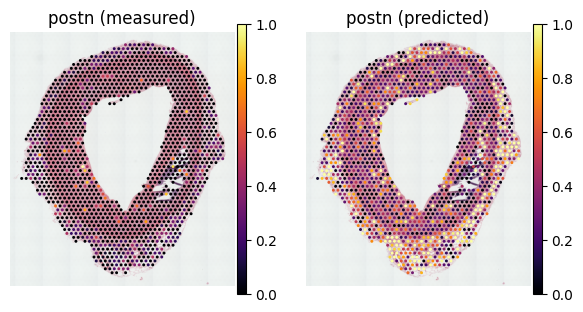

In [24]:
tg.plot_genes_sc(['postn'], adata_measured=ad_sp, adata_predicted=ad_ge, 
                 return_figure=False, perc = 0.1)